In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import random
import h5py
import math
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from matplotlib.ticker import FuncFormatter
from IPython.display import HTML
from IPython.display import Video
import jax
import jax.numpy as np
import fk
import numpy as onp

In [3]:
root = "/media/ep119/DATADRIVE3/epignatelli/deepexcite/"

In [4]:
name = root + "train_dev_set/spiral_params5.hdf5"

In [5]:
interval = 1  #ms

with h5py.File(name, "r") as file:
    states = file["states"][::interval, 2]
    print(file["states"].shape)
    print(states.shape)

(2000, 3, 1200, 1200)
(2000, 1200, 1200)


<IPython.core.display.Javascript object>

(<Figure size 432x288 with 2 Axes>,
 <matplotlib.axes._subplots.Axes3DSubplot at 0x7f5496e65510>)

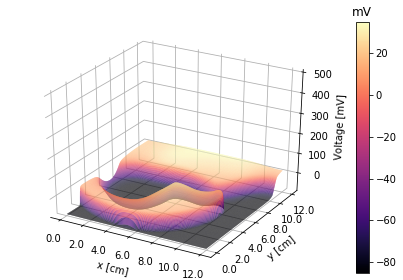

In [182]:
fk.plot.show3d(fk.convert.u_to_V(state), rcount=300, ccount=300, zlim=(-80, 500))

In [14]:
def animate3d(states, times=None, figsize=None, channel=None,
              vmin=None, vmax=None, zlim=None,
              rcount=200, ccount=200):
    # setup figure
    backend = matplotlib.get_backend()
    matplotlib.use("nbAgg")
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(projection="3d")
    # init surface plot
    r = list(range(0, len(states[0])))
    x, y = np.meshgrid(r, r)
#     plot = ax.plot_surface(x, y, state, rcount=rcount, ccount=ccount, 
#                            vmin=vmin, vmax=vmax, cmap="magma")
    plot = [None]
    
    def init():
        # init surface plot
#         plot[0].remove()
        plot[0] = ax.plot_surface(x, y, states[0], rcount=rcount, ccount=ccount,
                                  vmin=vmin, vmax=vmax, cmap="magma")
        # add colorbar
        cbar = fig.colorbar(plot[0])
        cbar.ax.set_title("mV", rotation=0)
        if zlim is not None:
            ax.set_zlim3d(zlim)
        # format axes
        ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
        ax.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
        ax.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.1f}'.format(y / 100)))
        ax.set_xlabel("x [cm]")
        ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.1f}'.format(y / 100)))
        ax.set_ylabel("y [cm]")
        ax.set_zlabel("Voltage [mV]")
        fig.tight_layout()
        return plot

    def update(iteration):
        print("Rendering {}\t".format(iteration + 1), end="\r")
        plot[0].remove()
        plot[0] = ax.plot_surface(x, y, states[iteration], rcount=rcount, ccount=ccount,
                                  vmin=vmin, vmax=vmax, cmap="magma")        
        if times is not None:
            ax.set_title("t: %d" % times[iteration])
        return plot

    animation = FuncAnimation(fig, update, frames=range(len(states)), init_func=init, blit=True)
    matplotlib.use(backend)
    return HTML(animation.to_html5_video())

In [16]:
V = fk.convert.u_to_V(states)
animate3d(V, vmin=-90, vmax=20, zlim=(-80, 800), rcount=200, ccount=200, figsize=(10, 6))

<IPython.core.display.Javascript object>